# 1. Dataset and Features

We are using the Spotify dataset. In this project, we wish to explore the relationship between the various numerical columns in the Spotify dataset to create predictions about a track given its characteristics. Specifically, we're interested in the correlations between numerical columns such as valence, energy, danceability, speechiness, and instrumentalness. Understanding these correlations will allow us to predict statistics such as popularity based on other track information.  

We start by importing the dataset (shown below), using the `pandas` link from HuggingFace.
Note for project members: you have to run this every time you reopen the notebook.

In [61]:
import pandas as pd
import tqdm as notebook_tqdm
spotify = pd.read_csv("hf://datasets/maharshipandya/spotify-tracks-dataset/dataset.csv")

# Dropping the Unnamed column (which is just the row index)
spotify = spotify.drop(columns=['Unnamed: 0'])

In [62]:
# import some libraries
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
import torch
pd.set_option('display.max_columns', None)
pd.options.mode.copy_on_write = True

# 2. Getting started

Print out the columns of the dataset.
Print out the first 20 rows of the dataset.

In [63]:
spotify.columns

Index(['track_id', 'artists', 'album_name', 'track_name', 'popularity',
       'duration_ms', 'explicit', 'danceability', 'energy', 'key', 'loudness',
       'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'time_signature', 'track_genre'],
      dtype='object')

In [64]:
spotify.head(20)

,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.7150,87.917,4,acoustic
1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.2670,77.489,4,acoustic
2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.1200,76.332,4,acoustic
3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.1430,181.740,3,acoustic
4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.1670,119.949,4,acoustic
5,01MVOl9KtVTNfFiBU9I7dc,Tyrone Wells,Days I Will Remember,Days I Will Remember,58,214240,False,0.688,0.4810,6,-8.807,1,0.1050,0.2890,0.000000,0.1890,0.6660,98.017,4,acoustic
6,6Vc5wAMmXdKIAM7WUoEb7N,A Great Big World;Christina Aguilera,Is There Anybody Out There?,Say Something,74,229400,False,0.407,0.1470,2,-8.822,1,0.0355,0.8570,0.000003,0.0913,0.0765,141.284,3,acoustic
7,1EzrEOXmMH3G43AXT1y7pA,Jason Mraz,We Sing. We Dance. We Steal Things.,I'm Yours,80,242946,False,0.703,0.4440,11,-9.331,1,0.0417,0.5590,0.000000,0.0973,0.7120,150.960,4,acoustic
8,0IktbUcnAGrvD03AWnz3Q8,Jason Mraz;Colbie Caillat,We Sing. We Dance. We Steal Things.,Lucky,74,189613,False,0.625,0.4140,0,-8.700,1,0.0369,0.2940,0.000000,0.1510,0.6690,130.088,4,acoustic
9,7k9GuJYLp2AzqokyEdwEw2,Ross Copperman,Hunger,Hunger,56,205594,False,0.442,0.6320,1,-6.770,1,0.0295,0.4260,0.004190,0.0735,0.1960,78.899,4,acoustic


In [65]:
# Get 20 random rows
spotify.sample(20)

,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
42861,7hI9OkDc2XpCBwsXkXgVF0,disrupt,Unrest,Deprived,12,78773,False,0.4860,0.988000,8,-4.984,1,0.0973,0.000005,0.000652,0.2720,0.4750,116.210,4,grindcore
50057,0ojGXbSAH6INkZX24Kfs2u,Accept,Too Mean to Die,The Best Is yet to Come,55,287466,False,0.4020,0.647000,11,-7.243,0,0.0320,0.002810,0.000018,0.1110,0.5080,167.973,4,heavy-metal
103376,4g0jzFkwHlO93vAilrQtIY,The Jackson 5,Holidays Are Coming,I Saw Mommy Kissing Santa Claus,0,181360,False,0.5820,0.705000,3,-8.169,1,0.0539,0.290000,0.000001,0.7970,0.6400,128.890,4,soul
81071,5EYZZvmNAH5VZCwuzYJqoA,Jatin-Lalit;Shaan;Kailash Kher;Prasoon Joshi,Fanaa,Chand Sifarish,72,275931,False,0.8290,0.665000,2,-8.128,1,0.0868,0.242000,0.000017,0.1230,0.8610,122.043,4,pop
65386,60dbY1IYizdQQVhC4QTyEc,Jubin Nautiyal;Payal Dev,Dil Chahte Ho,Dil Chahte Ho,53,252771,False,0.3000,0.399000,7,-6.951,1,0.0341,0.812000,0.000000,0.0978,0.2250,78.755,4,k-pop
19781,4j8z6XqDYjY4bEldGBSMIT,Tyler Braden,Hideaway - New Boots,Try Losing One,0,219640,False,0.4550,0.400000,2,-7.749,1,0.0293,0.546000,0.000000,0.0971,0.1030,139.828,4,country
19419,1BtZjD0TAUF4LaHXlFM5aH,Faith Hill,JULMYS,"Where Are You Christmas - From ""Dr. Seuss' How...",0,247040,False,0.3730,0.333000,10,-9.876,1,0.0303,0.590000,0.000000,0.1210,0.0815,110.241,4,country
67233,1z4WUEk8yk3KyYg8vXzorT,Wisin & Yandel,Perreo Tenebroso Vol. 1,Sexy Movimiento,0,211920,False,0.7870,0.858000,10,-4.152,0,0.0373,0.405000,0.000003,0.1330,0.8140,105.000,4,latin
66649,4JtYVvSrvGThVE9D5U6xK1,Kids Dance Party,Kids Dance Party,Cotton Eyed Joe,10,253451,False,0.9110,0.735000,9,-6.380,1,0.0569,0.000175,0.000999,0.0870,0.9350,132.573,4,kids
83288,3LNJXM1TJlksK5WnabNqDg,Armin van Buuren,"Feel Again, Pt. 2",Computers Take Over The World,0,152250,False,0.7770,0.832000,1,-5.739,1,0.1790,0.006320,0.050800,0.1200,0.7750,139.917,4,progressive-house


In [66]:
# Check the shape of spotify dataset
spotify.shape

(114000, 20)

In [68]:
# Sanity check: get the counts of each artist and track_name combination
counts = spotify.groupby(['artists', 'track_name']).size().reset_index(name='count')
print(counts)
print("There are " + str(sum(counts['count'] != 1)) + " artist, track_name combinations that are non-unique.")

                     artists  \
0                     !nvite   
1                     !nvite   
2      "Puppy Dog Pals" Cast   
3      "Puppy Dog Pals" Cast   
4        "Weird Al" Yankovic   
...                      ...   
81338                     黃妃   
81339                    黃小琥   
81340                    黃敏華   
81341                龍藏Ryuzo   
81342                龍藏Ryuzo   

                                              track_name  count  
0                                               pagadoff      1  
1                                              strolling      1  
2                                     Going on a Mission      1  
3                        Puppy Dog Pals Main Title Theme      1  
4      Amish Paradise (Parody of "Gangsta's Paradise"...      1  
...                                                  ...    ...  
81338                                              溫暖的所在      1  
81339                                              沒那麽簡單      1  
81340                

### Sanity checks!

- Are there any entries with null values
- Do numbers fall in the expected range


In [69]:
# popularity between 0 and 100
sum(spotify['popularity'] < 0) + sum(spotify['popularity'] > 100)

0

In [70]:
# danceability between 0.0 and 1.0
sum(spotify['danceability'] < 0.0) + sum(spotify['danceability'] > 1.0)

0

In [71]:
# energy is between 0.0 to 1.0
sum(spotify['energy'] < 0.0) + sum(spotify['energy'] > 1.0)

0

In [72]:
# mode is 0 or 1
sum(x not in [0,1] for x in spotify['mode'])

0

In [73]:
# speechiness between 0.0 and 1.0
sum(spotify['speechiness'] < 0.0) + sum(spotify['speechiness'] > 1.0)

0

In [74]:
# acousticness between 0.0 and 1.0
sum(spotify['acousticness'] < 0.0) + sum(spotify['acousticness'] > 1.0)

0

In [75]:
# instrumentalness between 0.0 and 1.0
sum(spotify['instrumentalness'] < 0.0) + sum(spotify['instrumentalness'] > 1.0)

0

In [76]:
# liveness between 0.0 and 1.0
sum(spotify['liveness'] < 0.0) + sum(spotify['liveness'] > 1.0)

0

In [77]:
# valence between 0.0 and 1.0
sum(spotify['valence'] < 0.0) + sum(spotify['valence'] > 1.0)

0

In [78]:
# positive tempo
sum(spotify['tempo'] < 0.0)

0

In [79]:
# time signature between 3 and 7 (inclusive)
sum(spotify['time_signature'] < 3) + sum(spotify['time_signature'] > 7)

1136

### Let's visualize some missing values!

In [80]:
# identify whether each tempo value is zero
# and group by genre (index)
# count number of zero values
zero_tempo_by_genre = spotify.set_index("track_genre")["tempo"].eq(0).groupby(level=0).sum()

# Convert the result to a DataFrame
zero_tempo_by_genre_df = zero_tempo_by_genre.reset_index()

# Create a bar chart
px.bar(zero_tempo_by_genre_df,
       x='track_genre',
       y='tempo',  # The count of zero tempo values
       labels={'0': 'Number of zero tempo values', 'genre': 'Genre'},
       title="Zero Tempo Values by Genre")

In [81]:
# identify whether each valence value is zero
# and group by genre (index)
# count number of zero values
zero_valence_by_genre = spotify.set_index("track_genre")["valence"].eq(0).groupby(level=0).sum()

# Convert the result to a DataFrame
zero_valence_by_genre_df = zero_valence_by_genre.reset_index()

# Create a bar chart
px.bar(zero_valence_by_genre_df,
       x='track_genre',
       y='valence',  # The count of zero valence values
       labels={'0': 'Number of zero valence values', 'genre': 'Genre'},
       title="Zero Valence Values by Genre")

In [82]:
# Filter time_signatures for values that are either less than 3 or greater than 7
invalid_time_signatures = spotify.set_index("track_genre")["time_signature"] \
    .apply(lambda x: x < 3 or x > 7)  # Create a boolean series where True indicates invalid values

# Group by track_genre and sum the invalid counts
time_signatures = invalid_time_signatures.groupby(level=0).sum()

time_signatures_df = time_signatures.reset_index()

# Create a bar chart
px.bar(time_signatures_df,
       x = 'track_genre',
       y='time_signature',  # The count of invalid time signature values
       labels={'0': 'Number of invalid time signatures', 'genre': 'Genre'},
       title="Invalid Time Signature by Genre")


# 2. Exploratory Data Analysis (EDA)

## Examining relationships between single variables

### Danceability and Energy

Danceability describes how easy it is to dance to a song, while energy measures how intense and active a track is. One would expect these to have a positive correlation, which the graph shows to a small extent.

Text(0.5, 1.0, 'Energy and Danceability of Spotify Tracks')

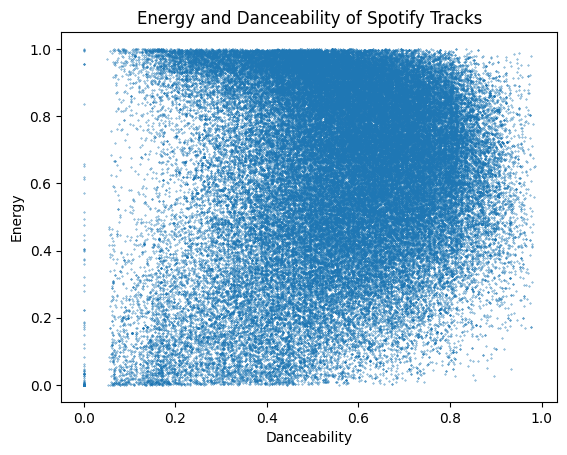

In [83]:
danceability = spotify['danceability']
energy = spotify['energy']
plt.scatter(danceability, energy, s=0.1)
plt.xlabel('Danceability')
plt.ylabel('Energy')
plt.title('Energy and Danceability of Spotify Tracks')

### Valence and Danceability

Valence is a measure describing how "positive" a track is, while danceability describes how suitable a track is to dance to. One might expect the two to have a positive correlation since more upbeat songs are often faster and more rhythmic, and thus easier to dance to.

Text(0.5, 1.0, 'Valence and Danceability of Spotify Tracks')

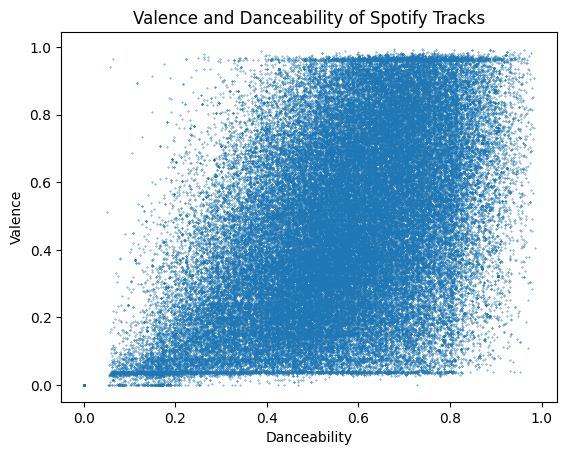

In [84]:
danceability = spotify['danceability']
energy = spotify['valence']
plt.scatter(danceability, energy, s=0.1)
plt.xlabel('Danceability')
plt.ylabel('Valence')
plt.title('Valence and Danceability of Spotify Tracks')

### Speechiness and Instrumentalness

Speechiness measures the presence of spoken words in a song, while instrumentalness predicts if a song contains no vocals. These two should be inversely related, which this graph somewhat shows.

Text(0.5, 1.0, 'Speechiness and Instrumentalness of Spotify Tracks')

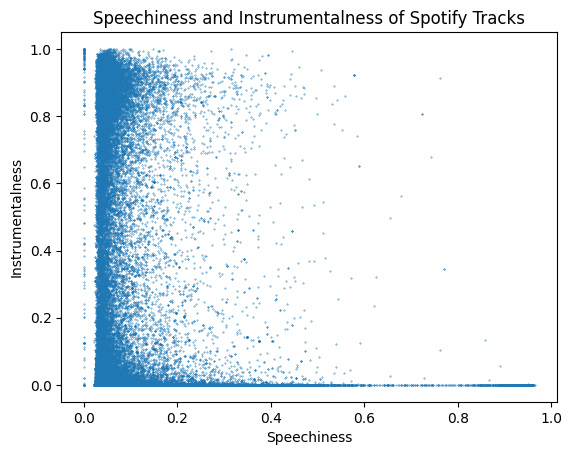

In [85]:
speechiness = spotify['speechiness']
instrumentalness = spotify['instrumentalness']
plt.scatter(speechiness, instrumentalness, s=0.1)
plt.xlabel('Speechiness')
plt.ylabel('Instrumentalness')
plt.title('Speechiness and Instrumentalness of Spotify Tracks')

### Energy and Loudness

Energy measures how intense and active a track is, while loudness measures the volume of the song (in decibels). One would expect these two to have a positive correlation, which is shown by the graph.

Text(0.5, 1.0, 'Energy and Loudness of Spotify Tracks')

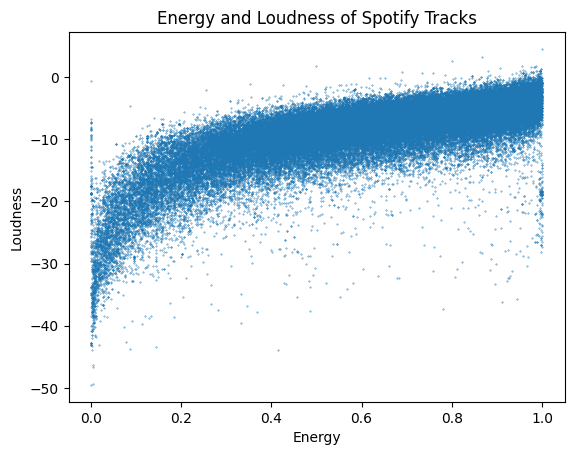

In [86]:
danceability = spotify['energy']
energy = spotify['loudness']
plt.scatter(danceability, energy, s=0.1)
plt.xlabel('Energy')
plt.ylabel('Loudness')
plt.title('Energy and Loudness of Spotify Tracks')

### Popularity with Respect to Valence and Danceability

Popularity measures how popular a song is. Valence and danceability are both numerical measures of how "positive" a track is, and how suitable it is to dance to, respectively.

The heatmap below will show the correlation between valence, danceability, and tracks with low popularity (defined as popularity below 10).

/var/folders/zb/5bv0cvh95s57__rlwsclnlsr0000gn/T/ipykernel_57791/4192607146.py:10: FutureWarning:

The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior



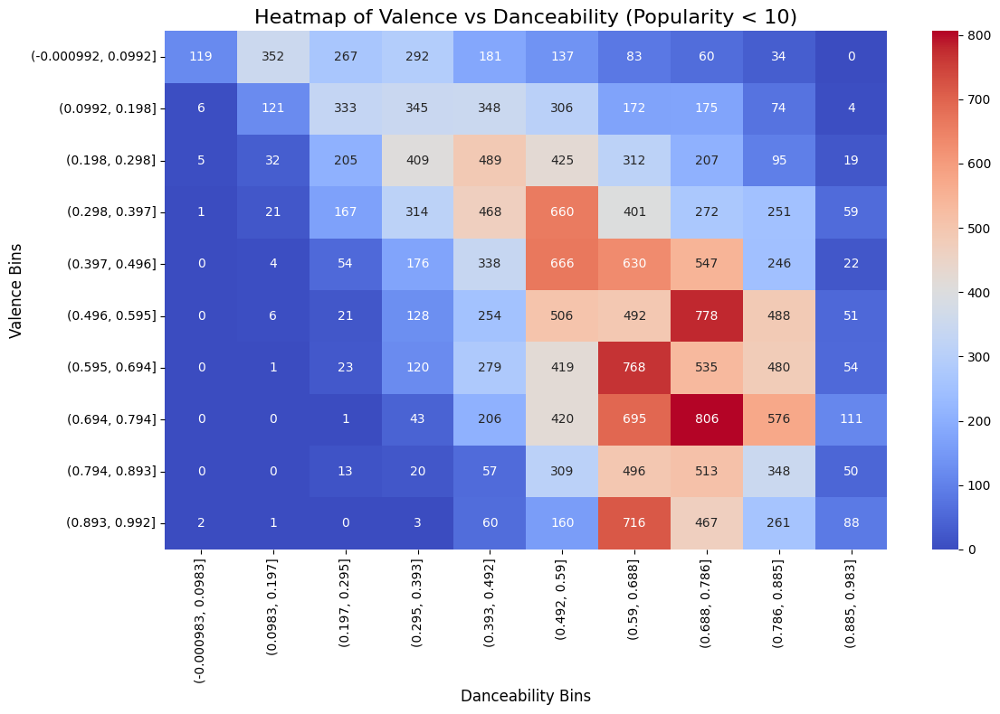

In [87]:
import seaborn as sns
# Filter the DataFrame for tracks where 'popularity' < 10
spotify_filtered = spotify[spotify['popularity'] < 10]

# Put 'valence' and 'danceability' into bins
spotify_filtered['valence_bin'] = pd.cut(spotify_filtered['valence'], bins=10)
spotify_filtered['danceability_bin'] = pd.cut(spotify_filtered['danceability'], bins=10)

# Create a table where rows are binned 'valence' and columns are binned 'danceability', and values are the counts
heatmap_data = spotify_filtered.pivot_table(index='valence_bin', columns='danceability_bin', aggfunc='size', fill_value=0)

plt.figure(figsize=(12, 8))

# Create the heatmap with seaborn
sns.heatmap(heatmap_data, cmap='coolwarm', annot=True, fmt='d')

# Add labels and title
plt.title('Heatmap of Valence vs Danceability (Popularity < 10)', fontsize=16)
plt.xlabel('Danceability Bins', fontsize=12)
plt.ylabel('Valence Bins', fontsize=12)

plt.tight_layout()
plt.show()

# 3. Feature Imputation
The Spotify dataset contains many missing values, which are largely encoded as placeholders, although `null` values are also used. Such values are incompatible with our models as they create nonsensical patterns in the data.

A basic strategy (shown below) would be to discard entire rows or columns which contain the missing or placeholder values. However, the data lost may be valuable, and it may be a better strategy to **impute** values by inferring them from known data.

Below are some features which we have identified as missing or placeholder values:

- Remove duplicate rows (same artist, same song, different genre or album)
  - These will have different track IDs
- Replace missing values
- Remove "Unnamed: 0" column (which is just the row number)

- Missing value:
  - Explicit = unknown
  - Key = -1

- Time signatures < 3 and > 7
  - Time signature of 0, usually means "sleep" genre

### Note for project members
**Warning**: `inPlace = True` will modify the original DataFrame. For example, if you `drop_duplicates inPlace`, the original spotify DataFrame will now never contain duplicates.

`drop_duplicates` has a `subset` argument. It will consider two rows duplicates if they have the same values for `subset`.

In [88]:
# Remove duplicate rows (the same song by same artist under different genre or album)
spotify_new = spotify.drop_duplicates(subset=['artists', 'track_name'], keep='first')
spotify_new.shape

(81344, 20)

### `impute_feature()` function

To handle any potential missing values or placeholders in the data.

Because the Spotify dataset has many "placeholder" values rather than NaN or real missing data, we found it helpful to specify a `placeholder_value` which will be treated as a NaN value.

In [89]:
def impute_feature(data, feature, group, impute_method="average", placeholder_value = 0):
  '''
  Imputes missing or placeholder values in a specified feature column based on the given impute method.

  Parameters:
  - data (pandas.DataFrame): The DataFrame containing the data to impute.
  - feature (str): The name of the column where missing or placeholder values should be imputed.
  - group (str or list of str): Column(s) by which to group the data before applying the imputation.
  - impute_method (str, optional): The method used to impute the missing values. Defaults to "average". Currently,
    only "average" is supported. This method performs forward and backward fills, then takes the average of both.
  - placeholder_value (numeric, optional): The placeholder value (like 0) that should be treated as missing, used
    when impute_method is "placeholder". Defaults to 0.

  Returns:
  - pandas.Series: A Series with the imputed values for the specified feature.

  Raises:
  - ValueError: If an unsupported impute method is provided.
  '''
  if(impute_method == "placeholder"):
    # Replace placeholder values with NaN
    data[feature] = data[feature].replace(placeholder_value, np.nan)

  if impute_method in ["average", "placeholder"]:
    # Change the impute method argument to lowercase
    impute_method = impute_method.lower()
    # Create 2 temp variables equal to feature
    data = data.assign(imputed_feature_prev=data[feature], imputed_feature_next=data[feature])
    # Fill first var with forward fill
    data["imputed_feature_prev"] = data.groupby(group)["imputed_feature_prev"].ffill()
    # Fill second var with backward fill
    data["imputed_feature_next"] = data.groupby(group)["imputed_feature_next"].bfill()
    # Define feature_imputed column to be mean of the forward and backward fill
    data["feature_imputed"] = data[["imputed_feature_next", "imputed_feature_prev"]].mean(axis=1, skipna=True)
    # Impute remaining missing values with 0
    data["feature_imputed"] = data["feature_imputed"].fillna(0)
    # Remove two temp vars
    data = data.drop(columns=["imputed_feature_prev", "imputed_feature_next"])
    return data["feature_imputed"]
  else:
    raise ValueError("Invalid impute_method")

In [90]:
# Test impute_feature and placeholder_value argument
spotify["imputed_valence"] = impute_feature(spotify,
                                            feature = "valence",
                                            group = "track_genre",
                                            impute_method = "placeholder",
                                            placeholder_value = 0.0995)

spotify[["track_name", "popularity", "danceability", "energy", "valence", "imputed_valence"]].sample(20, random_state=1259)

,track_name,popularity,danceability,energy,valence,imputed_valence
93786,Zachem ja vljubilsja,0,0.377,0.181,NaN,0.254
38390,Most Hated Girl,30,0.361,0.957,0.619,0.619
16842,"12 Variations in C Major on ""Ah, vous dirai-je...",15,0.435,0.094,0.818,0.818
33558,Выродок,50,0.760,0.753,0.249,0.249
36771,Tududu,33,0.784,0.449,0.536,0.536
21883,Pa Abajo - Tic-Toc,26,0.877,0.937,0.790,0.790
100695,Österlenvisan,34,0.620,0.892,0.863,0.863
1338,Kinkinzazo,25,0.688,0.948,0.957,0.957
90163,I'm On The Outside (Looking In),42,0.383,0.282,0.246,0.246
110983,Genesis - Radio Edit,27,0.500,0.996,0.116,0.116


In [91]:
def impute_closest_danceability(data, feature):
    '''
    Imputes missing values in the specified feature by using the closest non-missing value
    in terms of danceability within the same genre.

    Parameters:
    - data (pandas.DataFrame): The DataFrame containing the data to impute.
    - feature (str): The name of the column where missing values should be imputed.

    Returns:
    - pandas.Series: A Series with the imputed values for the specified feature.
    '''
    genre_col = "track_genre"
    danceability_col = "danceability"
    def find_closest_danceability(row, group):
        # Find the non-missing values within the same group
        non_missing = group.dropna(subset=[feature])
        # Compute absolute difference in danceability
        non_missing['danceability_diff'] = (non_missing[danceability_col] - row[danceability_col]).abs()
        # Return the value of the closest row in terms of danceability
        closest_row = non_missing.loc[non_missing['danceability_diff'].idxmin()]
        return closest_row[feature]

    # Group by genre
    grouped = data.groupby(genre_col)

    # Apply the imputation logic for missing values
    data[feature] = data.apply(lambda row: find_closest_danceability(row, grouped.get_group(row[genre_col]))
                               if pd.isna(row[feature]) else row[feature], axis=1)

    return data[feature]

In [92]:
# Test impute_closest_danceability
impute_closest_danceability(spotify, feature = "valence")

spotify[["track_name", "popularity", "danceability", "energy", "valence", "imputed_valence"]].sample(20, random_state=1259)

,track_name,popularity,danceability,energy,valence,imputed_valence
93786,Zachem ja vljubilsja,0,0.377,0.181,0.272,0.254
38390,Most Hated Girl,30,0.361,0.957,0.619,0.619
16842,"12 Variations in C Major on ""Ah, vous dirai-je...",15,0.435,0.094,0.818,0.818
33558,Выродок,50,0.760,0.753,0.249,0.249
36771,Tududu,33,0.784,0.449,0.536,0.536
21883,Pa Abajo - Tic-Toc,26,0.877,0.937,0.790,0.790
100695,Österlenvisan,34,0.620,0.892,0.863,0.863
1338,Kinkinzazo,25,0.688,0.948,0.957,0.957
90163,I'm On The Outside (Looking In),42,0.383,0.282,0.246,0.246
110983,Genesis - Radio Edit,27,0.500,0.996,0.116,0.116


# 4. Train/Test/Validation Set Creation

In [93]:
from sklearn.model_selection import train_test_split

spotify_train_val, spotify_test = train_test_split(spotify, test_size=0.2, random_state=42)
spotify_train, spotify_val = train_test_split(spotify_train_val, test_size=0.25, random_state=42)

In [94]:
# Verifying lengths of train, test, val sets
print(f'Train set length: {len(spotify_train)}')
print(f'Test set length: {len(spotify_test)}')
print(f'Validation set length: {len(spotify_val)}')

Train set length: 68400
Test set length: 22800
Validation set length: 22800


# Week 2 Check In

1. Choose a response variable (numeric, not discrete).
- y = loudness
2. Choose a predictor variable.
- X = energy
3. Model the regression and calculate the evaluation metrics on training and validation datasets.
4. Answer in your notebook if you see evidence of overfitting or underfitting.
5. Use one regularization technique and evaluate its performance.
6. Include code and explanation for the steps above in your notebook.

## 1. Response variable

We will use loudness for our response variable.

In [95]:
y_train = np.array(spotify_train['loudness'])

## 2. Predictor variable

We will use energy for our predictor variable, since it seems to have a mostly linear relationship with loudness.

In [96]:
X_train = np.array(spotify_train['energy']).reshape(-1, 1)

## 3. Modeling Regression

In [97]:
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
from mlxtend.evaluate import bias_variance_decomp

In [105]:
ls_area_fit = LinearRegression()
ls_area_fit.fit(X_train, y_train)
y_pred = ls_area_fit.predict(X_train)

slope = ls_area_fit.coef_[0]
intercept = ls_area_fit.intercept_

print(f'Slope: {slope}')
print(f'Intercept: {intercept}')

correlation_matrix = np.corrcoef(X_train.flatten(), y_train)
correlation_coefficient = correlation_matrix[0, 1]

print(f'Correlation Coefficient: {correlation_coefficient}')

Slope: 15.263372679352132
Intercept: -18.051778621340926
Correlation Coefficient: 0.7618926402774873


In [99]:
pred_df = pd.DataFrame({
    'X': X_train.flatten(),
    'y': y_train,
    'y_pred': y_pred
})

fig = px.scatter(spotify_train, x='energy', y='loudness')
regression_line = px.line(pred_df, x='X', y='y_pred')
regression_line.update_traces(line=dict(color='red'))
fig.add_traces(regression_line.data)
fig.show()

In [100]:
X_test = np.array(spotify_test['energy']).reshape(-1, 1)
y_test = np.array(spotify_test['loudness'])

avg_expected_loss, avg_bias, avg_var = bias_variance_decomp(
    ls_area_fit, X_train, y_train, X_test, y_test,
    loss='mse',
    random_seed=42
)

print(f'Square root of Average expected loss: {np.sqrt(avg_expected_loss):.4f}')
print(f'Average bias: {np.sqrt(avg_bias):.4f}')
print(f'Average std: {np.sqrt(avg_var):.4f}')

Square root of Average expected loss: 3.2318
Average bias: 3.2318
Average std: 0.0225


## 4. Overfitting or Underfitting?

Our model has very low variance and high bias, so there could be some evidence of underfitting. Looking at the graph, it appears that the data seems to curve downward slightly in a fashion reminiscent of a logarithm. The model would likely benefit by introducing a way for it to be non-linear, so it could better capture the trend of the data

## 5. Regularization

We will use ridge regularization on our model. This is likely not necessary or helpful since we don't have any issue with overfitting, but it will still be an instructive experience.

In [101]:
X = spotify_train['energy']
X_std = (X - X.mean()) / X.std()
y = spotify['loudness']

In [102]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(spotify_train['energy'].values.reshape(-1, 1))
X_test_scaled = scaler.fit_transform(spotify_test['energy'].values.reshape(-1, 1))
print(X_train_scaled, '\n')
print(X_test_scaled)

[[-0.29009375]
 [ 0.74361663]
 [ 0.05580165]
 ...
 [ 0.26651953]
 [ 0.94240709]
 [ 0.902649  ]] 

[[-0.18048342]
 [ 1.40997113]
 [ 0.63666741]
 ...
 [ 0.33770979]
 [ 0.42939013]
 [ 0.45330674]]


In [103]:
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error

alphas = [0.0, 0.1, 1.0, 10.0, 100.0]

ridge_scores = []

for alpha in alphas:
    ridge = Ridge(alpha=alpha)
    ridge.fit(X_train_scaled, spotify_train['loudness'])
    y_pred = ridge.predict(X_train_scaled)
    mse = mean_squared_error(spotify_train['loudness'], y_pred)
    ridge_scores.append(mse)

ridge = Ridge(alpha=1.0)

avg_expected_loss, avg_bias, avg_var = bias_variance_decomp(
    estimator=ridge,
    X_train=X_train_scaled,
    y_train=spotify_train['loudness'].values,
    X_test=X_test_scaled,
    y_test=spotify_test['loudness'].values,
    loss='mse',
    random_seed=42
)

print(f'Square root of Average expected loss: {np.sqrt(avg_expected_loss):.4f}')
print(f'Average bias: {np.sqrt(avg_bias):.4f}')
print(f'Average std: {np.sqrt(avg_var):.4f}')

ridge.fit(X_train_scaled, spotify_train['loudness'])

y_pred_train = ridge.predict(X_train_scaled)

print(f'\nRidge Coefficient (slope): {ridge.coef_[0]:.4f}')
print(f'Ridge Intercept: {ridge.intercept_:.4f}')

Square root of Average expected loss: 3.2323
Average bias: 3.2323
Average std: 0.0225

Ridge Coefficient (slope): 3.8390
Ridge Intercept: -8.2685


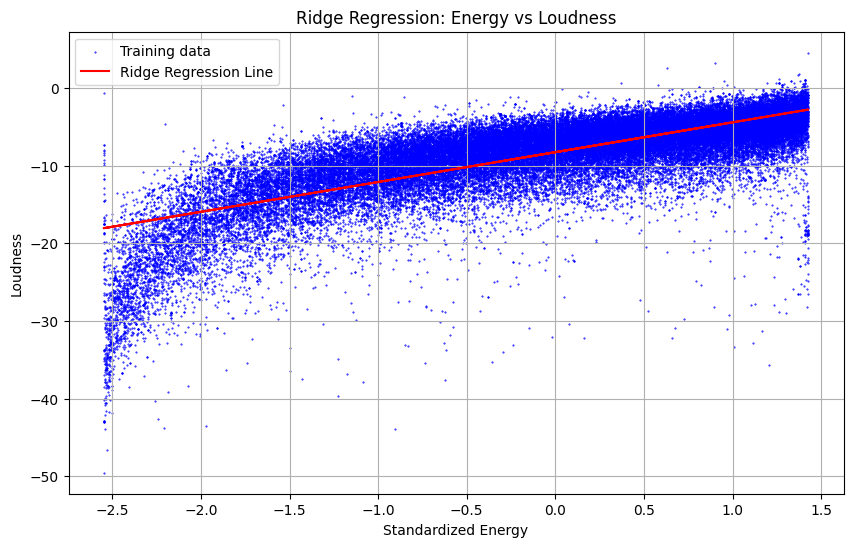

In [104]:


plt.figure(figsize=(10, 6))

# Scatter plot of the training data
plt.scatter(X_train_scaled, y_train, color='blue', s=0.2, label='Training data')

# Plot the regression line (fitted values on the training data)
plt.plot(X_train_scaled, y_pred_train, color='red', label='Ridge Regression Line')

# Labels and title
plt.title('Ridge Regression: Energy vs Loudness')
plt.xlabel('Standardized Energy')
plt.ylabel('Loudness')
plt.legend()
plt.grid(True)

plt.show()

### Results

The ridge regularization did not really help. The bias increased by a very small amount, from 3.2318 to 3.2323. The variance did not appear to change significantly. This makes sense since a model with only a single predictor variable does not need regularization.

## With multiple variables

Now, let's try linear regression with multiple variables. We will be able to see whether Ridge regularization can reduce overfitting, creating a simpler model that lowers the bias. 

This time, y_variable will be explicit and x_variables will include msot of the numerical features in the dataset. 

In [118]:
predictor_variables = ['popularity', 'danceability', 'energy', 'loudness', 'speechiness', 'instrumentalness', 'acousticness', 'valence', 'liveness', 'tempo', 'time_signature']
X = np.array(spotify_train[predictor_variables])
y = np.array(spotify_train['explicit'])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [119]:
ls_area_fit = LinearRegression()
ls_area_fit.fit(X_train, y_train)
y_pred = ls_area_fit.predict(X_train)

slope = ls_area_fit.coef_[0]
intercept = ls_area_fit.intercept_

y_pred = ls_area_fit.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
print(f"Mean Squared Error: {mse}")
print(f"Coefficients: {ls_area_fit.coef_}")
print(f"Intercept: {ls_area_fit.intercept_}")

Mean Squared Error: 0.06772535128344298
Coefficients: [ 4.95649452e-04  1.45323428e-01 -3.29823167e-02  2.20752970e-03
  8.08458266e-01 -6.00782181e-02 -7.02839552e-02 -9.85836649e-02
 -3.17678727e-02 -1.34271703e-04  5.67199924e-03]
Intercept: 0.03788391172596983


In [120]:
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

print("Scaled Training Data:\n", X_train_scaled[:5], '\n')  # Show first 5 rows
print("Scaled Test Data:\n", X_test_scaled[:5])

Scaled Training Data:
 [[ 0.57078668  0.90690884  0.01092174  0.1764041   0.1624863  -0.50151223
  -0.86286642  0.86681785  3.62536594 -1.00559913  0.22373847]
 [ 1.3787572   0.72171206  0.81433394  0.50486846 -0.27172273 -0.50400273
  -0.88846266  1.3617967   0.58237501  0.063767    0.22373847]
 [ 0.03213967  1.68242036  0.73478818 -0.02701645 -0.21144209 -0.50204783
  -0.94317838  1.47007332 -0.74466334 -0.41396026  0.22373847]
 [ 0.97477194 -0.75986219 -1.21408299 -0.0529426  -0.44973902 -0.50398692
   1.95000931 -1.02415604 -0.58436762  0.01195559  0.22373847]
 [ 0.70544843  0.09088552  0.25353632 -0.66440085  3.97712098 -0.50409662
  -0.54035385  0.85521678 -0.34261014  1.44523759  0.22373847]] 

Scaled Test Data:
 [[-1.49402687  0.57123967  0.61149225  0.89535615 -0.51378721 -0.50409662
  -0.72012977  1.00603065  0.79785451 -0.90628557  0.22373847]
 [ 0.92988469 -0.41261822 -1.53624333 -1.94096454 -0.53168302  2.22225461
   1.87472626 -1.52338861 -0.64270475  0.66352333  0.223738

In [ ]:
alphas = [0.0, 0.1, 1.0, 10.0, 100.0]
ridge_scores = []

for alpha in alphas:
    ridge = Ridge(alpha=alpha)
    ridge.fit(X_train_scaled, y_train)  
    y_pred = ridge.predict(X_train_scaled)  
    mse = mean_squared_error(y_train, y_pred)  
    ridge_scores.append(mse)

print("Ridge MSE Scores for different alpha values:")
for alpha, mse in zip(alphas, ridge_scores):
    print(f'Alpha: {alpha}, MSE: {mse:.4f}')

ridge = Ridge(alpha=1.0)

avg_expected_loss, avg_bias, avg_var = bias_variance_decomp(
    estimator=ridge,
    X_train=X_train_scaled,
    y_train=y_train,
    X_test=X_test_scaled,
    y_test=y_test,
    loss='mse',
    random_seed=42
)

print(f'\nSquare root of Average expected loss: {np.sqrt(avg_expected_loss):.4f}')
print(f'Average bias: {np.sqrt(avg_bias):.4f}')
print(f'Average std (variance): {np.sqrt(avg_var):.4f}')

ridge.fit(X_train_scaled, y_train)

print(f'\nRidge Coefficients (slopes): {ridge.coef_}')
print(f'Ridge Intercept: {ridge.intercept_:.4f}')

# Week 3 Check-In

## Logistic Regression

We are trying to predict if a track is explicit (explicit = True) based on its statistics.
This makes sense because our response variable (explicitness) must be either True or False.

Our independent variable is a set of numerical, continuous variables in our data. This includes popularity, danceability, and other statistics that can be seen below.

In [163]:
predictor_categories = ['popularity', 'danceability', 'energy', 'loudness', 'speechiness', 'instrumentalness', 'acousticness', 'valence', 'liveness', 'tempo', 'time_signature']
X_train = spotify_train[predictor_categories]
y_train = spotify_train['explicit']

X_val = spotify_val[predictor_categories]
y_val = spotify_val['explicit']

X_test = spotify_test[predictor_categories]
y_test = spotify_test['explicit']

In [164]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import recall_score

In [165]:
lr_fit = LogisticRegression(solver='liblinear')
lr_fit.fit(X=X_train, y=y_train)
lr_fit.intercept_, lr_fit.coef_

(array([-3.09154796]),
 array([[ 6.88159997e-03,  2.75763432e+00, -5.40471744e-01,
          1.03757209e-01,  6.05533692e+00, -1.48779551e+00,
         -1.42275446e+00, -1.50408259e+00, -3.51286680e-01,
         -1.24407541e-03,  1.69442380e-01]]))

In [166]:
# Predict the probabilities for the test set
y_pred_probs = lr_fit.predict_proba(X_train)

# Show the predicted probabilities for the first five examples
print('probabilities for the first 5 examples:')
print("Predicted:\n", y_pred_probs[:5, 1])
print(f"True:\n {y_train.values[:5]}")

y_pred_df = pd.DataFrame({'y_pred': y_pred_probs[:, 1], 'y_true': y_train})
print(y_pred_df.sample(20))

probabilities for the first 5 examples:
Predicted:
 [0.1189328  0.14103498 0.21139798 0.01531563 0.34395641]
True:
 [False False  True False  True]
          y_pred  y_true
90515   0.030911   False
30699   0.076850   False
4235    0.001644   False
38076   0.074510   False
41827   0.071068   False
58570   0.118433   False
2243    0.042660   False
82264   0.070594   False
108160  0.013567   False
103850  0.029488   False
61050   0.082855   False
36313   0.133665   False
24400   0.008789   False
109930  0.020187   False
96461   0.024455   False
106404  0.182238    True
11158   0.072733   False
89046   0.115758    True
89723   0.098892   False
6068    0.056329   False


In [167]:
# Predict the target values for the test set
# y_pred = lr_fit.predict(X_train)
threshold = 0.2
y_pred = (y_pred_probs[:, 1] >= threshold)

# check the predictions
print(f"y_pred: {y_pred[:10]}")
print(f"y_val: {y_val.values[:10]}")

y_pred: [False False  True False  True False False False  True False]
y_val: [False False False False False False False False False False]


In [168]:
conf_lr = confusion_matrix(y_true=y_train, y_pred=y_pred)
conf_lr

array([[58928,  3590],
       [ 3852,  2030]])

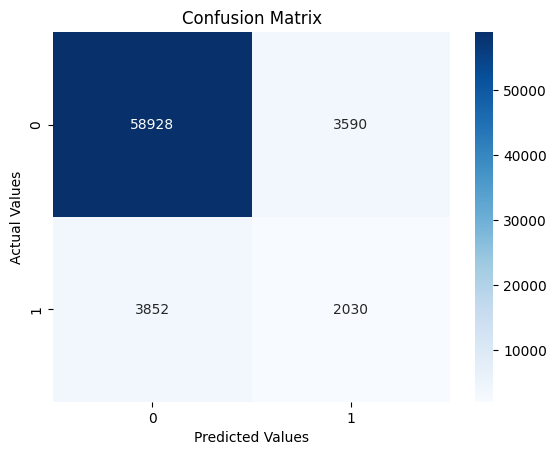

In [169]:
# Confusion Matrix
cm = conf_lr
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.ylabel("Actual Values")
plt.xlabel("Predicted Values")
plt.show()

In [170]:
# Classification Report (precision, recall, f1-score)
print("Classification Report:")
print(classification_report(y_train, y_pred))

Classification Report:
              precision    recall  f1-score   support

       False       0.94      0.94      0.94     62518
        True       0.36      0.35      0.35      5882

    accuracy                           0.89     68400
   macro avg       0.65      0.64      0.65     68400
weighted avg       0.89      0.89      0.89     68400



For class False (not explicit):
* precision was 0.94: Of all tracks predicted to have been not explicit, 94% actually were not explicit.
* recall is 0.94: Of all that were actually not explicit, 94% were correctly identified by the model.

For class True (explicit):
* Precision is 0.36: Of all tracks predicted to have been explicit, 36% actually were explicit.
* Recall is 0.35: Of all that were actually explicit, only 35% were correctly identified by the model.

In [171]:
lr_fpr, lr_tpr, lr_thresholds = roc_curve(y_train, y_pred_probs[:, 1])
print(len(lr_thresholds))

18927


In [172]:
lr_auc = roc_auc_score(y_train, y_pred_probs[:, 1])
print(f'AUC: {lr_auc:.5f}')

AUC: 0.80174


In [173]:
roc_lr_sample = pd.DataFrame({
    'False Positive Rate': lr_fpr,
    'True Positive Rate': lr_tpr,
    'Threshold': lr_thresholds,
    'Model': 'Logistic Regression'
}, index=lr_thresholds)


roc_sample_df = pd.concat([roc_lr_sample])


px.line(roc_sample_df, y='True Positive Rate', x='False Positive Rate',
        color='Model',
        width=700, height=500,
        hover_data={'Threshold': True}
)

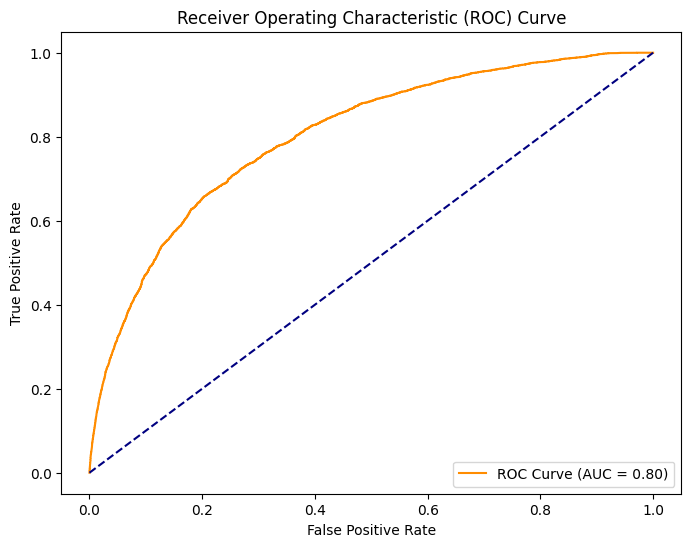

In [174]:
plt.figure(figsize=(8, 6))
plt.plot(lr_fpr, lr_tpr, label=f'ROC Curve (AUC = {lr_auc:.2f})', color='darkorange')
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

In [175]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler
import numpy as np


# Scale features
X_cv = X_val
y_cv = y_val

# Initialize the logistic regression model
model_cv = LogisticRegression(max_iter=2000)

# Perform 5-Fold Cross-Validation on the validation set
cv_scores = cross_val_score(model_cv, X_cv, y_cv, cv=5, scoring='accuracy')
cv_auc_scores = cross_val_score(model_cv, X_cv, y_cv, cv=5, scoring='roc_auc')

# Output the cross-validation scores for each fold
print(f"Cross-Validation Scores for each fold: {cv_scores}")
print(f"Mean Cross-Validation Accuracy: {np.mean(cv_scores) * 100:.2f}%")
print(f"AUC Scores for each fold: {cv_auc_scores}")


Cross-Validation Scores for each fold: [0.91951754 0.91995614 0.91337719 0.91600877 0.91776316]
Mean Cross-Validation Accuracy: 91.73%
AUC Scores for each fold: [0.82127975 0.79158581 0.79463014 0.80869089 0.80293611]


# 7. Classification


We are trying to use the KNN algorithm to predict if a track is explicit. This makes sense because we can classify the explicitness of a track into two different classes since the explicitness of a track must be either true or false. Therefore, explicitness is a binary variable.



In [176]:
from sklearn.neighbors import KNeighborsClassifier

We are using 5 neighbors since this led to a high cross-validation accuracy without costing performance like higher values would.

In [177]:
knn = KNeighborsClassifier(n_neighbors = 5)
knn.fit(X_train, y_train)


KNeighborsClassifier()

In [178]:
# Predict the probabilities for the test set
y_pred_probs_knn = knn.predict_proba(X_train)

# Show the predicted probabilities for the first five examples
print('probabilities for the first 5 examples:')
print("Predicted:\n", y_pred_probs_knn[:5, 1])
print(f"True:\n {y_train.values[:5]}")

y_pred_df_knn = pd.DataFrame({'y_pred': y_pred_probs_knn[:, 1], 'y_true': y_train})
print(y_pred_df_knn.sample(20))

probabilities for the first 5 examples:
Predicted:
 [0.4 0.  0.4 0.2 0.4]
True:
 [False False  True False  True]
        y_pred  y_true
19368      0.4   False
51459      0.0   False
71660      0.2   False
85914      0.0   False
34068      0.0   False
60658      0.2    True
107887     0.0   False
106467     0.0   False
56437      0.0   False
102203     0.0   False
70409      0.2   False
102903     0.0   False
30486      0.0   False
89461      0.0   False
30644      0.0   False
41950      0.0   False
87960      0.2    True
66136      0.0   False
92731      0.2   False
78338      0.0   False


We are using 0.25 for the threshold (meaning at least 2 neighbors must be explicit) since this led to a good balance between true positive and lowest false positive rates.

In [179]:
#Predict target values for the test set
threshold = 0.25
y_pred_knn = (y_pred_probs_knn[:, 1] >= threshold)

#Check the predictions
print(f"y_pred: {y_pred_knn[:10]}")
print(f"y_val: {y_val.values[:10]}")

y_pred: [ True False  True False  True False False False False False]
y_val: [False False False False False False False False False False]


In [180]:
conf_knn = confusion_matrix(y_true=y_train, y_pred=y_pred_knn)
conf_knn

array([[59487,  3031],
       [ 2556,  3326]])

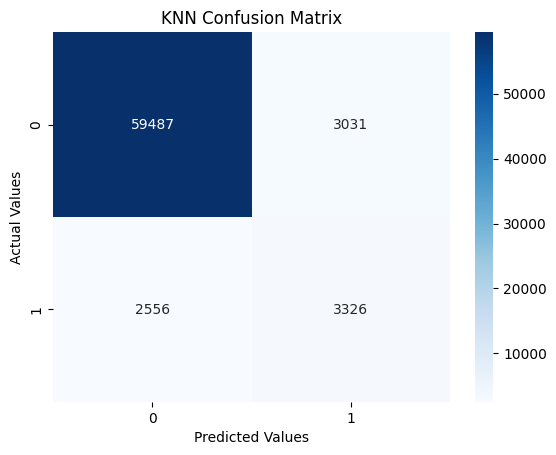

In [181]:
#Confusion Matrix
cm_knn = conf_knn
sns.heatmap(cm_knn, annot=True, fmt="d", cmap="Blues")
plt.title("KNN Confusion Matrix")
plt.ylabel("Actual Values")
plt.xlabel("Predicted Values")
plt.show()

In [182]:
#KNN Classification Report (precision, recall, f1-score)
print("KNN Classification Report:")
print(classification_report(y_train, y_pred_knn))

KNN Classification Report:
              precision    recall  f1-score   support

       False       0.96      0.95      0.96     62518
        True       0.52      0.57      0.54      5882

    accuracy                           0.92     68400
   macro avg       0.74      0.76      0.75     68400
weighted avg       0.92      0.92      0.92     68400



In [183]:
tp_rate = 3326 / (3326 + 2556)
fp_rate = 3031 / (59487 + 3031)
print(f'True Positive Rate: {tp_rate}')
print(f'False Positive Rate: {fp_rate}')

True Positive Rate: 0.5654539272356341
False Positive Rate: 0.04848203717329409


For class False (not explicit):

*   precision was 0.96: Of all tracks predicted to have been not explicit, 96% were actually not explicit.
*   recall is 0.95: Of all that were actually not explicit, 95% were correctly identified by the model.

For class True (explicit):

*   precision was 0.52: Of all tracks predicted to have been explicit, 52% were actually explicit
*   recall is 0.57: Of all that were actually not explicit, 57% were correctly idenfified by the model.

The True Positive Rate was 0.5655, while the False Positive Rate was 0.0485. The F1 score was 0.96 for the False class and 0.54 for the True class.



In [184]:
knn_fpr, knn_tpr, knn_thresholds = roc_curve(y_train, y_pred_probs_knn[:, 1])
knn_tnr = 1-knn_fpr
print(knn_tpr)
print(knn_fpr)
print(knn_tnr)
print(len(knn_thresholds))

[0.         0.07429446 0.12631758 0.26436586 0.56545393 1.
 1.        ]
[0.         0.         0.00132762 0.00841358 0.04848204 0.21329857
 1.        ]
[1.         1.         0.99867238 0.99158642 0.95151796 0.78670143
 0.        ]
7


In [185]:
knn_auc = roc_auc_score(y_train, y_pred_probs_knn[:,1])
print(f'AUC: {knn_auc:.5f}')

AUC: 0.93385


In [186]:
roc_knn_sample = pd.DataFrame({
    '1 - True Negative Rate': 1 - knn_tnr,
    'True Positive Rate': knn_tpr,
    'Threshold': knn_thresholds,
    'Model': 'KNN'
    }, index=knn_thresholds)

roc_sample_df = pd.concat([roc_knn_sample])

px.line(roc_sample_df, y='True Positive Rate', x='1 - True Negative Rate',
        color='Model',
        width=700, height=500,
        hover_data = {'Threshold': True}

)

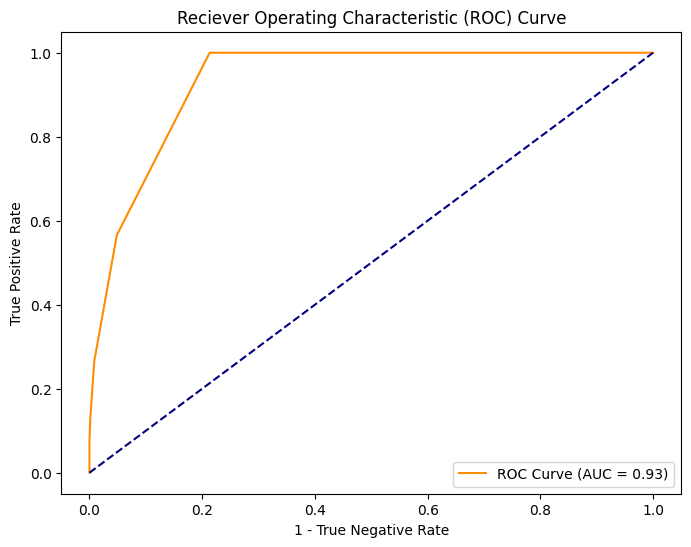

In [187]:
plt.figure(figsize=(8,6))
plt.plot(1 - knn_tnr, knn_tpr, label=f'ROC Curve (AUC = {knn_auc:.2f})', color = 'darkorange')
plt.plot([0,1], [0,1], color='Navy', linestyle='--')
plt.xlabel('1 - True Negative Rate')
plt.ylabel('True Positive Rate')
plt.title('Reciever Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

In [188]:
#Scale features
X_cv = X_val
y_cv = y_val

#Initialize the KNN Model
model_cv = KNeighborsClassifier(n_neighbors=5)

#Perform 5-Fold Cross Validation on Validation set
cv_scores = cross_val_score(model_cv, X_cv, y_cv, cv=5, scoring='accuracy')
cv_auc_scores = cross_val_score(model_cv, X_cv, y_cv, cv=5, scoring='roc_auc')

#Output the cross-validation socres for each fold
print(f"Cross-Validation Scores for each fold: {cv_scores}")
print(f"Mean Cross-Validation Accuracy: {np.mean(cv_scores) * 100:.2f}%")
print(f"AUC Scores for each fold: {cv_auc_scores}")


Cross-Validation Scores for each fold: [0.90964912 0.90789474 0.90767544 0.90921053 0.90899123]
Mean Cross-Validation Accuracy: 90.87%
AUC Scores for each fold: [0.61900754 0.61551098 0.61599213 0.60912193 0.60557861]


## Check-in 5

In [189]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [190]:
spotify_data = spotify.select_dtypes(include=[np.number]).dropna()
spotify_data.drop(['imputed_valence'], axis=1, inplace=True)
# Standardize the data
scaler = StandardScaler()
spotify_scaled = scaler.fit_transform(spotify_data)

# Check the shape of the dataset after standardization
print("Shape of the standardized data:", spotify_scaled.shape)

Shape of the standardized data: (114000, 14)


In [191]:

pca = PCA()

spotify_pca = pca.fit_transform(spotify_scaled)

explained_variance = pca.explained_variance_ratio_

print("variance for each component: ", explained_variance)

variance for each component:  [0.21193711 0.10961934 0.09077125 0.08336699 0.07410436 0.06989574
 0.06444581 0.0632142  0.05946147 0.05581628 0.05211635 0.0320312
 0.02323295 0.00998695]


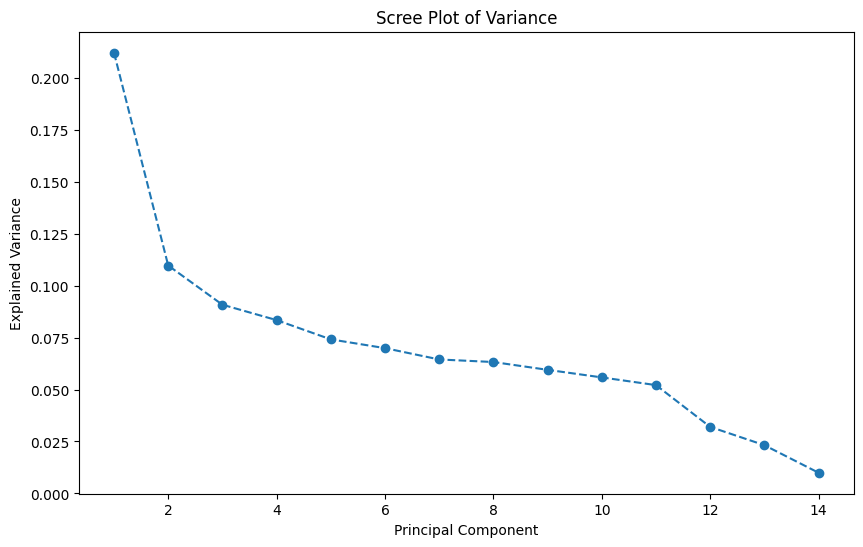

In [192]:
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='--')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance')
plt.title('Scree Plot of Variance')
plt.show()

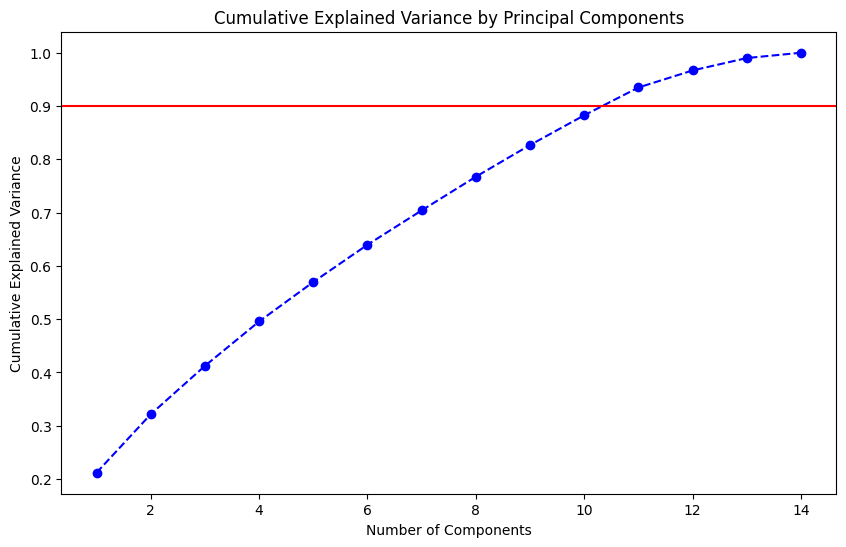

In [193]:
cumulative_variance = np.cumsum(explained_variance)

# Plot cumulative explained variance
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, marker='o', linestyle='--', color='b')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Cumulative Explained Variance by Principal Components')
plt.axhline(y=0.9, color='r', linestyle='-')  # can change this based on what threshold we want
plt.show()

In [194]:
loadings = pd.DataFrame(pca.components_.T, columns=[f'PC{i+1}' for i in range(len(pca.components_))], index=spotify_data.columns)
print("PCA Loadings:")
print(loadings)

PCA Loadings:
                       PC1       PC2       PC3       PC4       PC5       PC6  \
popularity        0.032863  0.025949 -0.096848  0.178469  0.867504 -0.230013   
duration_ms      -0.010415 -0.396064 -0.212427 -0.049812 -0.092350 -0.446513   
danceability      0.254155  0.474492 -0.236983 -0.183570 -0.116666 -0.223350   
energy            0.494817 -0.272052  0.068368  0.003226 -0.061049  0.004978   
key               0.048901 -0.021120 -0.113185 -0.554456  0.227617  0.426290   
loudness          0.503213 -0.082648  0.018874  0.104217  0.059716  0.049739   
mode             -0.057573  0.108781  0.185440  0.630998 -0.197666 -0.013521   
speechiness       0.094552  0.067114  0.527962 -0.359682 -0.081818 -0.217485   
acousticness     -0.429564  0.319992  0.148667 -0.021873  0.049717  0.018342   
instrumentalness -0.272497 -0.319694 -0.217542 -0.184751 -0.273684 -0.093231   
liveness          0.074490 -0.153337  0.646469 -0.103296  0.079549 -0.206370   
valence           0.290281

We are using PCA to determine the strucure of our data and also potentially for dimension reduction. When examining the scree plot and the cumulative variance plot, we decided that because 90% of variance was contributed by the first 10 components, that those would be our most important components. Additionally, we were able to apply dimensionality reduction by examining 15 PC's and then reducing them based on the scree plot and the cumulative variance to 10 PC's. Based on the loadings, we noticed that in PC1, which explains about 22% of the variance, energy loudness, and valence have high positive loadings whereas acousticness has a high negative loading. This could mean that PC1 is capturing a contrast between high energy, loud songs and quieter songs. The second principal component (PC2) has high positive loadings for acousticness and valence. This may represent a pattern where acoustic and positive (happy) tracks are distinguished from other types. PC3 has a strong positive loading on liveness and speechiness, which might indicate that PC3 captures a pattern related to live or spoken-word tracks. Based on this PCI, we notice that since none of the PC's contribute significantly in comparison to the other PC's, there isn't a significant necessity for us to examine one PC in terms of narrowing down the biggest contributors to correlation.

# Check-In 6

In this check-in, we are implementing a neural network in order to perform binary classification for explicitness on tracks based on numerical features, namely 'popularity','danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness','valence', 'tempo', and 'time_signature'. 

In order to train our neural network, we created train, test, and validation splits of our original pandas DataFrame before reformatting them as datasets, changing the DataFrames into tensors to represent the numerical features we are training on, and the labels or ground truth, of the actual binary classification of "explicit" for a particular track. 

To learn parameters, such as the learning rate for each parameter, we implement an AdamW optimizer which adjusts the learning rate of each parameter based on its gradient history, allowing it to optimize the network's learning in a computationally efficient way. To learn the hyperparameter of learning rate, we tested and observed the batch loss, the f1score, and the accuracy score after each epoch. We then adjusted the learning rate by increasing it, if the loss seemed to get stuck in a local minimum, or decreased it if the loss appeared to oscillate. 

To measure the performance of our NN, we implement a few metrics. The network itself trains using binary cross entropy loss (BCE). In order to measure the neural network performance, we also implement an f1 score and accuracy score. The f1 score is calculated mathematically as 2 * precision * recall / (precision + recall) although our implementation differs a little in order to extract precision and recall. The accuracy is calculated by finding the number of correct predictions over the number of total samples.

Results:
After training our model for 50 epochs, we get an F1 Score on the validation set of 0.6477 and an accuracy on the validation set of 0.8327 when using a threshold of 0.15 (we found that threshold to work best). The large class imbalance makes it hard for the model to be much more accurate than this.

In [195]:
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from sklearn.preprocessing import RobustScaler

class SpotifyDataset(Dataset):
    def __init__(self, dataframe):
        self.data = torch.tensor(dataframe.iloc[:, :-1].values, dtype=torch.float32)  # Features
        self.labels = torch.tensor(dataframe.iloc[:, -1].values, dtype=torch.float32)    # Labels

    def __len__(self):
        return len(self.data)
    
    def __getitem__(self, idx):
        return self.data[idx], self.labels[idx]
    
nn_predictor_categories = ['popularity', 'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature']
nn_dataset_categories = nn_predictor_categories + ['explicit']

train_nn_df = spotify_train[nn_dataset_categories]
val_nn_df = spotify_val[nn_dataset_categories]

scaler = RobustScaler()
train_nn_df = pd.DataFrame(scaler.fit_transform(train_nn_df), columns=train_nn_df.columns)
val_nn_df = pd.DataFrame(scaler.fit_transform(val_nn_df), columns=val_nn_df.columns)

train_dataset = SpotifyDataset(train_nn_df)
val_dataset = SpotifyDataset(val_nn_df)

training_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
validation_loader = DataLoader(val_dataset, batch_size=64, shuffle=True)

In [196]:
import torch.nn as nn

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

class MLPModel(nn.Module):
    def __init__(self):
        super().__init__()
        self.linear1 = nn.Linear(in_features=13, out_features=50, device=device)
        self.relu = nn.ReLU()
        self.linear2 = nn.Linear(in_features=50, out_features=1, device=device)

    def forward(self, x):
        x = self.linear1(x)
        x = self.relu(x)
        logits = self.linear2(x)
        probs = torch.sigmoid(logits)
        return probs

In [197]:
def train_one_epoch(model, training_loader, loss_fn, optimizer, threshold=0.1):
    running_loss = 0
    last_loss = 0

    correct = 0
    total = 0

    for i, data in enumerate(training_loader):
        inputs, labels = data

        optimizer.zero_grad()

        outputs = model(inputs)

        preds = (outputs > threshold).long().squeeze()
        correct += (preds == labels).sum().item()
        total += labels.size(0)

        loss = loss_fn(outputs, labels.unsqueeze(1))
        loss.backward()

        optimizer.step()

        running_loss += loss.item()
        if i == len(training_loader) - 1:
            last_loss = running_loss / len(training_loader)  # Loss per batch
            # print(f'batch loss: {last_loss}')
    
    # f1_train = f1_score(all_labels, all_preds, average='macro')
    accuracy_train = correct / total
    
    return last_loss, accuracy_train

In [198]:
from sklearn.metrics import f1_score

def train(model, training_loader, validation_loader, loss_fn, optimizer, num_epochs=50, verbose=False, threshold=0.1):
    for epoch in range(1, num_epochs+1):
        # Put model in training mode and run one training step
        model.train()
        avg_loss, accuracy_train = train_one_epoch(model, training_loader, loss_fn, optimizer)

        # Initialize evaluation variables
        all_preds = []
        all_labels = []
        correct = 0
        total = 0
        running_vloss = 0

        # Put model in evaluation mode
        model.eval()
        with torch.no_grad():
            for i, vdata in enumerate(validation_loader):
                # Run model forward pass on validation data and calculate statistics
                vinputs, vlabels = vdata
                voutputs = model(vinputs)
                vloss = loss_fn(voutputs, vlabels.unsqueeze(1))
                running_vloss += vloss

                vpreds = (voutputs > threshold).long().squeeze()

                correct += (vpreds == vlabels).sum().item()
                total += vlabels.size(0)

                all_preds.extend(vpreds.cpu().numpy())
                all_labels.extend(vlabels.cpu().numpy())

        # Calculate F1 Score and Accuracy
        val_f1 = f1_score(all_labels, all_preds, average='macro')
        val_accuracy = correct / total

        avg_vloss = running_vloss / (i + 1)
        
        # Output statistics
        if verbose:
            print(f'Epoch {epoch}')
            print(f'Average train loss: {avg_loss}')
            print(f'Average validation loss: {avg_vloss}')
            print(f'Train Accuracy: {accuracy_train}')
            print(f'Validation F1 Score: {val_f1}')
            print(f'Validation Accuracy: {val_accuracy}')
            print()
    
    return avg_loss, avg_vloss, accuracy_train, val_f1, val_accuracy

In [202]:
# Initialize model, loss function, and optimizer
model = MLPModel()
loss_fn = nn.BCELoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=0.0001)

# Run training loop
train(model, training_loader, validation_loader, loss_fn, optimizer, num_epochs=10, verbose=True)

Epoch 1
Average train loss: 0.497155985576288
Average validation loss: 0.3502981662750244
Train Accuracy: 0.1632017543859649
Validation F1 Score: 0.27016173281489464
Validation Accuracy: 0.2825877192982456

Epoch 2
Average train loss: 0.3023753669130345
Average validation loss: 0.26878899335861206
Train Accuracy: 0.3905701754385965
Validation F1 Score: 0.42278167156940044
Validation Accuracy: 0.48947368421052634

Epoch 3
Average train loss: 0.2563522172807755
Average validation loss: 0.24587474763393402
Train Accuracy: 0.5823538011695907
Validation F1 Score: 0.5222933467409772
Validation Accuracy: 0.6469298245614035

Epoch 4
Average train loss: 0.24384783297582024
Average validation loss: 0.23877635598182678
Train Accuracy: 0.6895029239766082
Validation F1 Score: 0.5621159412441907
Validation Accuracy: 0.712938596491228

Epoch 5
Average train loss: 0.23939452686942103
Average validation loss: 0.23587684333324432
Train Accuracy: 0.7330994152046784
Validation F1 Score: 0.5783290930700773

(0.23265815952791022,
 tensor(0.2303),
 0.7595321637426901,
 np.float64(0.5927501369818706),
 0.7523684210526316)

## Cross Validation

In [200]:
from sklearn.model_selection import StratifiedKFold

def cross_validation(k_folds=5, num_epochs=15, lr=0.0001):
    # Initialize StratifiedKFold splitter
    kf = StratifiedKFold(n_splits=k_folds, shuffle=True)

    # Prepare dataframe with selected categories
    nn_predictor_categories = ['popularity', 'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature']
    nn_dataset_categories = nn_predictor_categories + ['explicit']
    cv_spotify = spotify_train_val[nn_dataset_categories]


    # Scale data
    scaler = RobustScaler()
    cv_spotify = pd.DataFrame(scaler.fit_transform(cv_spotify), columns=cv_spotify.columns)
    
    # Split data into 5 folds
    for i, (train_index, val_index) in enumerate(kf.split(cv_spotify[nn_predictor_categories], cv_spotify['explicit'])):
        # Get train and validation sets from StratifiedKFolds
        cv_train = cv_spotify.iloc[train_index, :]
        cv_val = cv_spotify.iloc[val_index, :]
        
        # Create datasets from dataframes
        cv_train_dataset = SpotifyDataset(cv_train)
        cv_val_dataset = SpotifyDataset(cv_val)

        # Create dataloaders from datasets
        cv_training_loader = DataLoader(cv_train_dataset, batch_size=64, shuffle=True)
        cv_validation_loader = DataLoader(cv_val_dataset, batch_size=64, shuffle=True)

        # Initialize model, loss function, and optimizer
        cv_model = MLPModel()
        cv_loss_fn = nn.BCELoss()
        cv_optimizer = torch.optim.AdamW(cv_model.parameters(), lr=lr)

        # Run model's training loop
        avg_loss, avg_vloss, accuracy_train, val_f1, val_accuracy = train(cv_model, cv_training_loader, cv_validation_loader, cv_loss_fn, cv_optimizer, num_epochs=num_epochs, verbose=False, threshold=0.15)

        # Display statistics
        print(f'Fold {i+1}\n')
        print(f'Average train loss: {avg_loss}')
        print(f'Average validation loss: {avg_vloss}')
        print(f'Train Accuracy: {accuracy_train}')
        print(f'Validation F1 Score: {val_f1}')
        print(f'Validation Accuracy: {val_accuracy}\n')
        

In [201]:
cross_validation(k_folds=5, num_epochs=10, lr=0.0001)

Fold 1

Average train loss: 0.23251730387278816
Average validation loss: 0.23014754056930542
Train Accuracy: 0.7623766447368421
Validation F1 Score: 0.6408418907616105
Validation Accuracy: 0.8365679824561404

Fold 2

Average train loss: 0.23175382447478018
Average validation loss: 0.23338156938552856
Train Accuracy: 0.7634320175438597
Validation F1 Score: 0.6373526001625337
Validation Accuracy: 0.8373355263157894

Fold 3

Average train loss: 0.2325266442800823
Average validation loss: 0.23285655677318573
Train Accuracy: 0.7633634868421053
Validation F1 Score: 0.6425752390614958
Validation Accuracy: 0.8389802631578948

Fold 4

Average train loss: 0.23301591607170147
Average validation loss: 0.2323801964521408
Train Accuracy: 0.762952302631579
Validation F1 Score: 0.6356981833315103
Validation Accuracy: 0.8327850877192983

Fold 5

Average train loss: 0.23222366016554205
Average validation loss: 0.23431602120399475
Train Accuracy: 0.7597998903508771
Validation F1 Score: 0.6370147411474195